In [1]:
%matplotlib inline

# 1) Wipe out your namespace
%reset -f

# 2) Clear Jupyter’s stored outputs (and inputs if you like)
try:
    Out.clear() 
except NameError:
    pass

try:
    In.clear()
except NameError:
    pass

# 3) Force Python GC
import gc
gc.collect()

# 4) Free any GPU buffers
import torch
if torch.cuda.is_available():
    torch.cuda.empty_cache()


import importlib
from libs import trades, plots, params, feats, strategies
importlib.reload(trades)
importlib.reload(plots)
importlib.reload(params)
importlib.reload(feats)
importlib.reload(strategies)

<module 'libs.strategies' from '/workspace/my_models/Trading/_Stock_Analysis_/libs/strategies.py'>

In [2]:
import numpy as np
import pandas as pd
pd.set_option('display.max_columns', None)

import matplotlib.pyplot as plt
import seaborn as sns

import glob
import os
import json
import re
import os
import psutil

import time
import datetime as dt
from tqdm.auto import tqdm
from IPython.display import clear_output, display

In [3]:
# Read the unscaled indicators dataframe (only the test part)

df_inds_test = pd.read_csv(params.indunsc_test_csv, index_col=0, parse_dates=True)
# compute synthetic ask/bid from close_raw and configured spread
df_inds_test['ask'] = df_inds_test['close'] * (1 + params.bidask_spread_pct/100)
df_inds_test['bid'] = df_inds_test['close'] * (1 - params.bidask_spread_pct/100)
df_inds_test['rsi_thresh'] = params.rsi_thresh_tick

df_inds_test

,open,high,low,close,volume,signal,ret,log_ret,sma_9,sma_21,sma_pct_9,sma_pct_21,ema_9,ema_21,roc_9,roc_21,body,body_pct,upper_shad,lower_shad,range_pct,rsi_6,macd_line,macd_signal,macd_diff,atr_14,atr_pct_14,bb_lband_20,bb_hband_20,bb_w_20,plus_di,minus_di,adx,obv,vwap_14,vwap_dev_pct_14,vol_spike,vol_z_14,rolling_max_close_21,rolling_min_close_21,dist_high_21,dist_low_21,obv_sma,obv_diff_14,obv_pct_14,obv_sma_14,obv_z_14,ret_30,sma_30,sma_pct_30,ema_30,roc_30,rsi_30,atr_30,atr_pct_30,bb_lband_30,bb_hband_30,bb_w_30,plus_di_30,minus_di_30,adx_30,obv_diff_30,obv_pct_30,obv_sma_30,obv_z_30,vwap_30,vwap_dev_pct_30,z_vwap_dev_30,vol_spike_30,vol_z_30,ret_std_30,rolling_max_close_30,rolling_min_close_30,dist_high_30,dist_low_30,macd_line_30,macd_signal_30,macd_diff_30,ret_45,sma_45,sma_pct_45,ema_45,roc_45,rsi_45,atr_45,atr_pct_45,bb_lband_45,bb_hband_45,bb_w_45,plus_di_45,minus_di_45,adx_45,obv_diff_45,obv_pct_45,obv_sma_45,obv_z_45,vwap_45,vwap_dev_pct_45,z_vwap_dev_45,vol_spike_45,vol_z_45,ret_std_45,rolling_max_close_45,rolling_min_close_45,dist_high_45,dist_low_45,macd_line_45,macd_signal_45,macd_diff_45,ret_60,sma_60,sma_pct_60,ema_60,roc_60,rsi_60,atr_60,atr_pct_60,bb_lband_60,bb_hband_60,bb_w_60,plus_di_60,minus_di_60,adx_60,obv_diff_60,obv_pct_60,obv_sma_60,obv_z_60,vwap_60,vwap_dev_pct_60,z_vwap_dev_60,vol_spike_60,vol_z_60,ret_std_60,rolling_max_close_60,rolling_min_close_60,dist_high_60,dist_low_60,macd_line_60,macd_signal_60,macd_diff_60,volume_z_30,vol_spike_z_30,ret_std_z_30,obv_pct_z_30,vwap_dev_pct_z_30,bb_w_z_30,atr_z_30,macd_diff_z_30,volume_z_45,vol_spike_z_45,ret_std_z_45,obv_pct_z_45,vwap_dev_pct_z_45,bb_w_z_45,atr_z_45,macd_diff_z_45,volume_z_60,vol_spike_z_60,ret_std_z_60,obv_pct_z_60,vwap_dev_pct_z_60,bb_w_z_60,atr_z_60,macd_diff_z_60,minute_time,hour_time,dow_time,month_time,day_of_year_time,week_of_year_time,in_sess_time,eng_ma,eng_macd,eng_bb,eng_bb_mid,eng_rsi,eng_adx,eng_obv,eng_atr_div,z_eng_atr,eng_sma_short,eng_sma_long,eng_vwap,z_vwap_dev,z_bb_w,z_obv,mom_sum_30,mom_std_30,mom_sum_45,mom_std_45,mom_sum_60,mom_std_60,eng_ema_cross_up,eng_ema_cross_down,ask,bid,rsi_thresh
2022-12-23 10:58:00,132.506667,132.506667,132.506667,132.506667,3.766667e+02,0.068838,-0.000025,-0.000025,132.517407,132.463651,-0.000081,0.000325,132.501714,132.450580,0.000126,0.000428,0.000,0.000000,0.000,0.000,0.000000,55.324571,0.066914,0.076274,-0.009361,0.030896,0.000233,132.351547,132.577120,0.001703,53.329334,22.545811,52.004170,4.810433e+04,132.024282,0.365375,0.462019,-0.911671,132.540,132.36,0.000252,0.001107,4.767483e+04,4.656333e+03,35.146275,4.767483e+04,0.269138,0.002547,132.419889,0.000655,132.403860,0.002547,67.514546,0.034648,0.000261,132.220285,132.619493,0.003015,49.033670,19.075239,40.643327,1.196033e+04,90.321276,4.478294e+04,0.370286,132.417943,0.067003,-1.435313,0.424020,-0.936193,0.000271,132.540,132.20,0.000252,0.002314,0.084061,0.080324,0.003737,0.003663,132.310329,0.001484,132.330747,0.003663,67.477198,0.037214,0.000281,131.957731,132.662926,0.005330,45.383192,19.249055,28.521447,2.131996e+04,161.136009,4.104582e+04,0.244755,132.288077,0.165238,-0.378640,0.394909,-1.100015,0.000230,132.540,132.028750,0.000252,0.003607,0.072126,0.069040,0.003086,0.004638,132.228319,0.002105,132.270541,0.004638,66.814987,0.038612,0.000291,131.810366,132.646273,0.006322,43.207120,20.127475,0.000000,4.737383e+04,358.272975,3.439157e+04,0.345499,132.165188,0.258373,0.724499,0.327654,-1.358106,0.000201,132.540,131.922500,0.000252,0.004409,0.063599,0.059554,0.004045,-0.467325,-0.000002,0.190732,-0.326255,-0.796174,-0.714829,-2.471902,-20.000000,-0.677505,-0.000002,20.000000,-20.000000,-20.000000,20.000000,-1.096288,0.000000,-0.861826,-1.606155e-11,0.000000,0.000000,20.000000,20.000000,-0.187204,0.000000,0.352778,0.312500,0.071429,0.416667,0.475342,0.461538,0.0,0.000406,-0.000071,0.00000,-0.000319,0.000000,0.098520,0.099620,-0.242750,-1.828533,0.000081,-0.000325,-99.724259,-0.805629,0.201443,-0.950054,0.087051,0.000484,0.145175

In [250]:
importlib.reload(params) #####
importlib.reload(strategies) #####
df_inds_test = df_inds_test[df_inds_test.index.to_period("M") == params.month_to_check] ################################

sim_results = {}
groups = df_inds_test.groupby(df_inds_test.index.normalize())
total_days = df_inds_test.index.normalize().nunique()

for day, df_day in tqdm(groups, desc="Generate+Simulate", total=total_days):
    
    # df_actions = strategies.generate_trade_actions(
    #     df              = df_day,
    #     col_signal      = "ema_9",
    #     sign_thresh     = "ema_21",
    #     sellmin_idx     = params.sellmin_idx_tick,
    #     trailstop_pct   = params.trailstop_pct_tick,
    #     sess_start      = params.sess_start_tick
    # )
    
    df_actions = strategies.generate_tradact_elab(
        df              = df_day,
        col_signal      = "ema_9",
        sign_thresh     = "ema_21",
        col_atr         = "atr_14",
        col_rsi         = "rsi_6",
        col_vwap        = "vwap_14",
        rsi_thresh      = params.rsi_thresh_tick,
        sellmin_idx     = params.sellmin_idx_tick,
        trailstop_pct   = params.trailstop_pct_tick,
        atr_mult        = params.atr_mult_tick,
        vwap_atr_mult   = params.vwap_atr_mult_tick,
        sess_start      = params.sess_start_tick
    )
    
    sim_results.update(
        strategies.simulate_trading(
            day         = day,
            df          = df_actions,
            sellmin_idx = params.sellmin_idx_tick,
            sess_start  = params.sess_start_tick
        )
    )

print("Loop finished. Days simulated:", len(sim_results))


Generate+Simulate:   0%|          | 0/20 [00:00<?, ?it/s]

Loop finished. Days simulated: 20


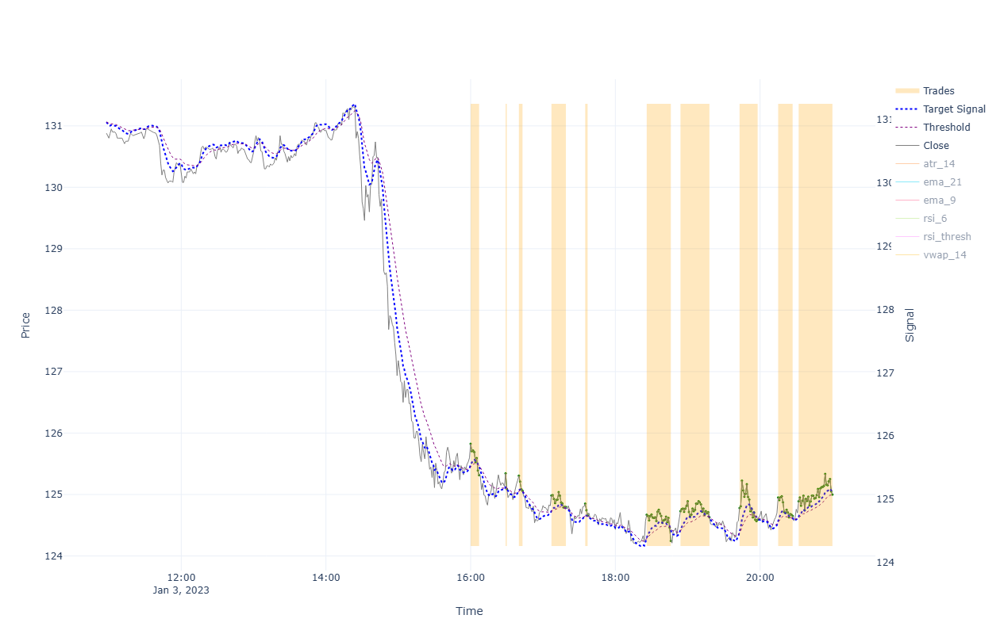


=== Performance for 2023-01-03 00:00:00 ===

BUY&HOLD:
  Bid(0) 124.975 - Ask(0) 129.786 - Fee(0) [0.004+0.021] = -4.836
TRADES:
  Bid(1) 125.29 - Ask(1) 125.85 - Fee(1) [0.004+0.021] = -0.586
  Bid(2) 125.066 - Ask(2) 125.37 - Fee(2) [0.004+0.021] = -0.33
  Bid(3) 125.035 - Ask(3) 125.33 - Fee(3) [0.004+0.021] = -0.321
  Bid(4) 124.77 - Ask(4) 125.01 - Fee(4) [0.004+0.021] = -0.265
  Bid(5) 124.635 - Ask(5) 124.875 - Fee(5) [0.004+0.021] = -0.265
  Bid(6) 124.22 - Ask(6) 124.695 - Fee(6) [0.004+0.021] = -0.5
  Bid(7) 124.605 - Ask(7) 124.755 - Fee(7) [0.004+0.021] = -0.175
  Bid(8) 124.565 - Ask(8) 124.805 - Fee(8) [0.004+0.021] = -0.265
  Bid(9) 124.625 - Ask(9) 124.975 - Fee(9) [0.004+0.021] = -0.375
  Bid(10) 124.975 - Ask(10) 124.915 - Fee(10) [0.004+0.0] = 0.056
STRATEGY:
  Trade(1) -0.586 + Trade(2) -0.33 + Trade(3) -0.321 + Trade(4) -0.265 + Trade(5) -0.265 + Trade(6) -0.5 + Trade(7) -0.175 + Trade(8) -0.265 + Trade(9) -0.375 + Trade(10) 0.056 = -3.026

-----------------------

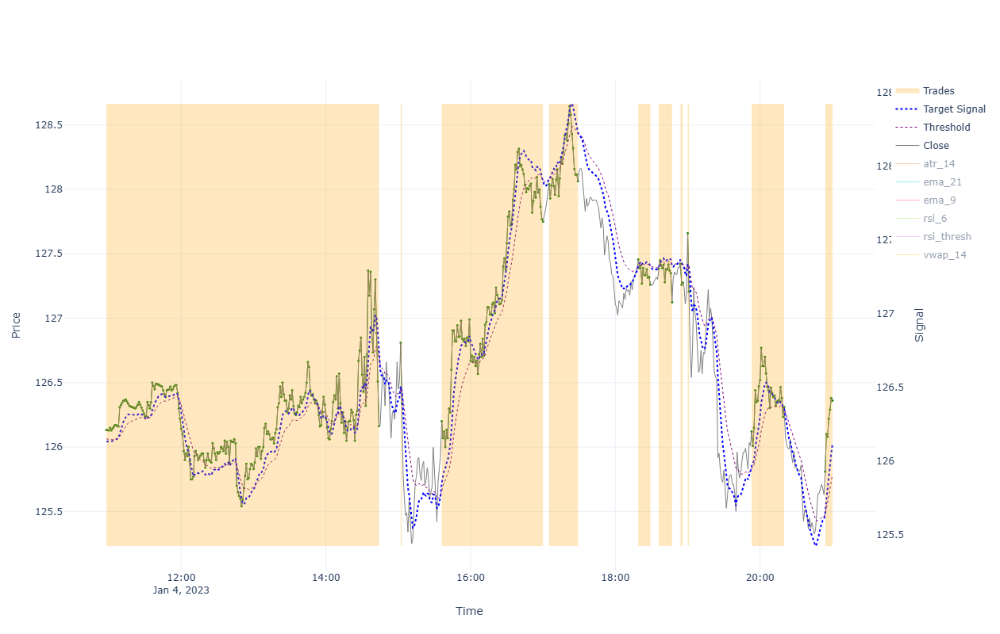


=== Performance for 2023-01-04 00:00:00 ===

BUY&HOLD:
  Bid(0) 126.335 - Ask(0) 126.587 - Fee(0) [0.004+0.022] = -0.278
TRADES:
  Bid(1) 126.138 - Ask(1) 124.975 - Fee(1) [0.0+0.022] = 1.142
  Bid(2) 126.315 - Ask(2) 126.835 - Fee(2) [0.004+0.022] = -0.546
  Bid(3) 127.726 - Ask(3) 126.225 - Fee(3) [0.004+0.022] = 1.475
  Bid(4) 128.039 - Ask(4) 128.066 - Fee(4) [0.004+0.022] = -0.052
  Bid(5) 127.235 - Ask(5) 127.48 - Fee(5) [0.004+0.022] = -0.272
  Bid(6) 127.1 - Ask(6) 127.41 - Fee(6) [0.004+0.022] = -0.337
  Bid(7) 127.25 - Ask(7) 127.445 - Fee(7) [0.004+0.022] = -0.222
  Bid(8) 127.181 - Ask(8) 127.686 - Fee(8) [0.004+0.022] = -0.53
  Bid(9) 126.286 - Ask(9) 126.145 - Fee(9) [0.004+0.022] = 0.115
  Bid(10) 126.335 - Ask(10) 125.835 - Fee(10) [0.004+0.0] = 0.496
STRATEGY:
  Trade(1) 1.142 + Trade(2) -0.546 + Trade(3) 1.475 + Trade(4) -0.052 + Trade(5) -0.272 + Trade(6) -0.337 + Trade(7) -0.222 + Trade(8) -0.53 + Trade(9) 0.115 + Trade(10) 0.496 = 1.269

--------------------------

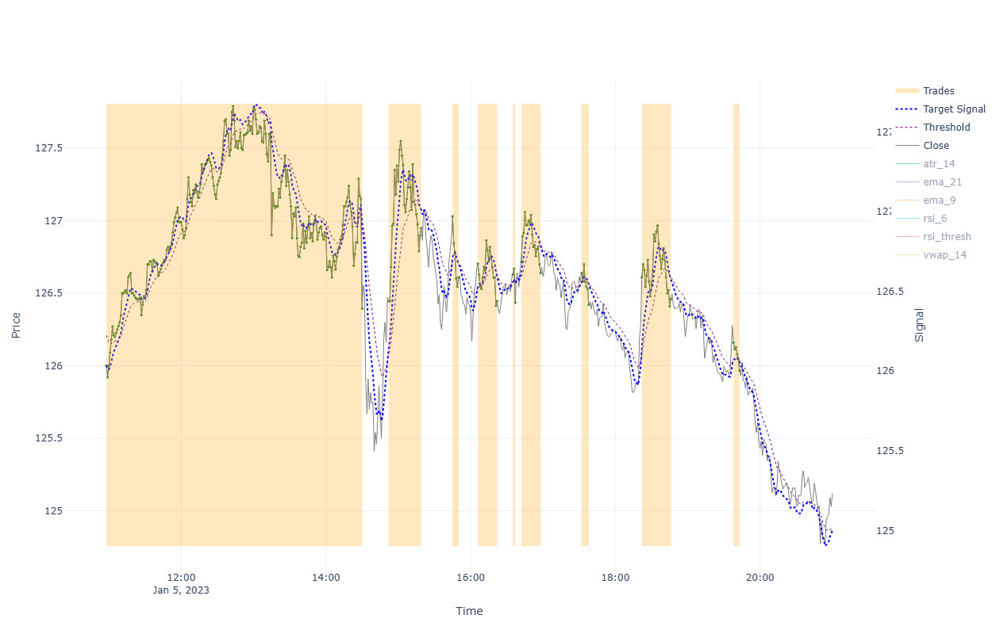


=== Performance for 2023-01-05 00:00:00 ===

BUY&HOLD:
  Bid(0) 125.095 - Ask(0) 126.42 - Fee(0) [0.004+0.021] = -1.351
TRADES:
  Bid(1) 126.37 - Ask(1) 126.335 - Fee(1) [0.0+0.022] = 0.013
  Bid(2) 126.925 - Ask(2) 126.47 - Fee(2) [0.004+0.022] = 0.429
  Bid(3) 126.585 - Ask(3) 127.055 - Fee(3) [0.004+0.022] = -0.496
  Bid(4) 126.42 - Ask(4) 126.729 - Fee(4) [0.004+0.022] = -0.335
  Bid(5) 126.41 - Ask(5) 126.655 - Fee(5) [0.004+0.022] = -0.271
  Bid(6) 126.614 - Ask(6) 126.74 - Fee(6) [0.004+0.022] = -0.152
  Bid(7) 126.396 - Ask(7) 126.665 - Fee(7) [0.004+0.022] = -0.295
  Bid(8) 126.435 - Ask(8) 126.635 - Fee(8) [0.004+0.022] = -0.226
  Bid(9) 125.942 - Ask(9) 126.185 - Fee(9) [0.004+0.022] = -0.268
STRATEGY:
  Trade(1) 0.013 + Trade(2) 0.429 + Trade(3) -0.496 + Trade(4) -0.335 + Trade(5) -0.271 + Trade(6) -0.152 + Trade(7) -0.295 + Trade(8) -0.226 + Trade(9) -0.268 = -1.601

----------------------------------------------------------------------------------------------------------

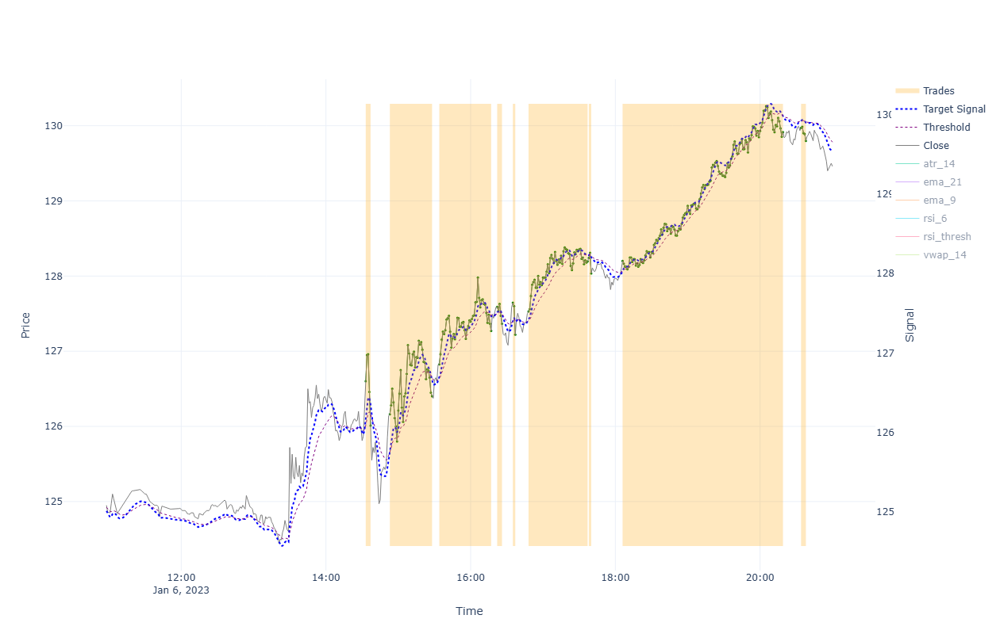


=== Performance for 2023-01-06 00:00:00 ===

BUY&HOLD:
  Bid(0) 129.434 - Ask(0) 125.835 - Fee(0) [0.004+0.022] = 3.573
TRADES:
  Bid(1) 125.985 - Ask(1) 126.626 - Fee(1) [0.004+0.022] = -0.667
  Bid(2) 126.375 - Ask(2) 126.185 - Fee(2) [0.004+0.022] = 0.164
  Bid(3) 127.245 - Ask(3) 126.85 - Fee(3) [0.004+0.022] = 0.368
  Bid(4) 127.34 - Ask(4) 127.615 - Fee(4) [0.004+0.022] = -0.302
  Bid(5) 127.195 - Ask(5) 127.671 - Fee(5) [0.004+0.022] = -0.502
  Bid(6) 128.171 - Ask(6) 127.556 - Fee(6) [0.004+0.022] = 0.59
  Bid(7) 128.009 - Ask(7) 128.266 - Fee(7) [0.004+0.022] = -0.282
  Bid(8) 129.889 - Ask(8) 128.228 - Fee(8) [0.004+0.022] = 1.635
  Bid(9) 129.774 - Ask(9) 129.996 - Fee(9) [0.004+0.022] = -0.248
STRATEGY:
  Trade(1) -0.667 + Trade(2) 0.164 + Trade(3) 0.368 + Trade(4) -0.302 + Trade(5) -0.502 + Trade(6) 0.59 + Trade(7) -0.282 + Trade(8) 1.635 + Trade(9) -0.248 = 0.756

------------------------------------------------------------------------------------------------------------

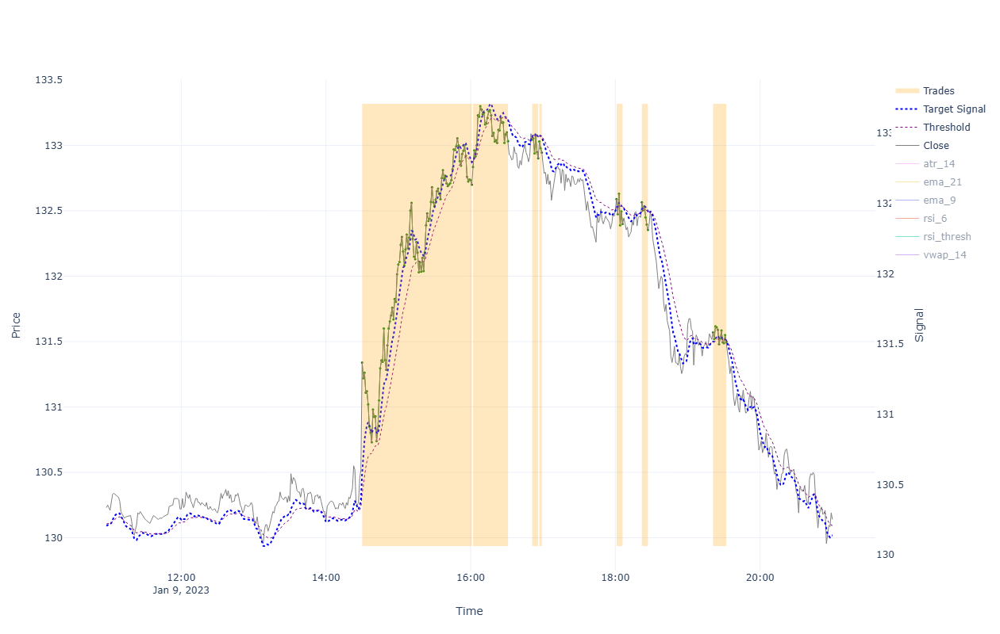


=== Performance for 2023-01-09 00:00:00 ===

BUY&HOLD:
  Bid(0) 130.114 - Ask(0) 131.366 - Fee(0) [0.004+0.022] = -1.278
TRADES:
  Bid(1) 132.673 - Ask(1) 131.366 - Fee(1) [0.004+0.022] = 1.281
  Bid(2) 133.005 - Ask(2) 132.862 - Fee(2) [0.004+0.023] = 0.117
  Bid(3) 132.874 - Ask(3) 133.071 - Fee(3) [0.004+0.023] = -0.224
  Bid(4) 132.918 - Ask(4) 133.057 - Fee(4) [0.004+0.023] = -0.165
  Bid(5) 132.374 - Ask(5) 132.617 - Fee(5) [0.004+0.022] = -0.269
  Bid(6) 132.329 - Ask(6) 132.592 - Fee(6) [0.004+0.022] = -0.289
  Bid(7) 131.469 - Ask(7) 131.596 - Fee(7) [0.004+0.022] = -0.154
STRATEGY:
  Trade(1) 1.281 + Trade(2) 0.117 + Trade(3) -0.224 + Trade(4) -0.165 + Trade(5) -0.269 + Trade(6) -0.289 + Trade(7) -0.154 = 0.297

------------------------------------------------------------------------------------------------------------------------



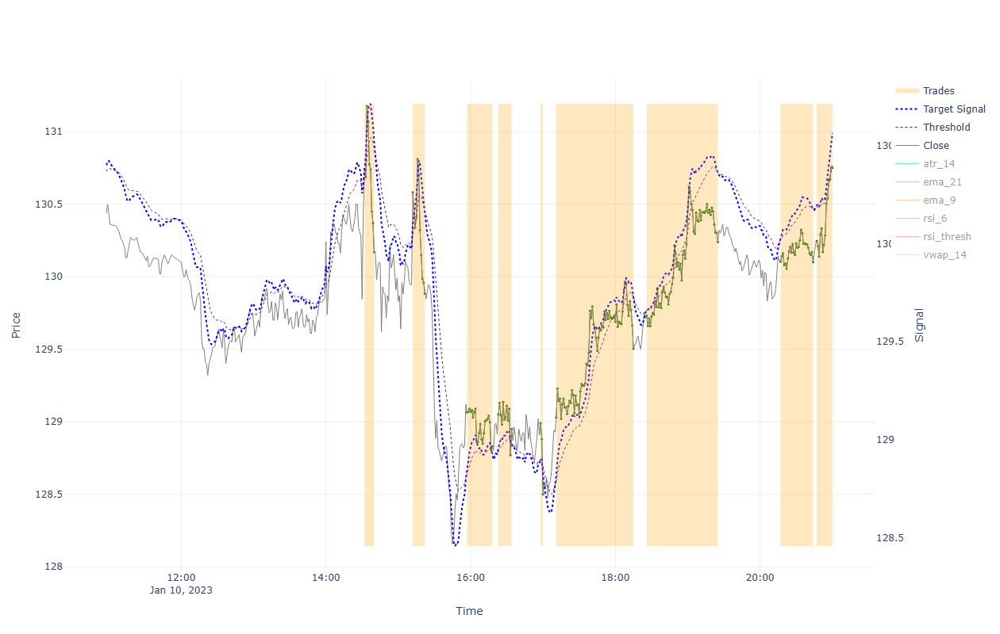


=== Performance for 2023-01-10 00:00:00 ===

BUY&HOLD:
  Bid(0) 130.724 - Ask(0) 129.871 - Fee(0) [0.004+0.022] = 0.827
TRADES:
  Bid(1) 130.144 - Ask(1) 130.766 - Fee(1) [0.004+0.022] = -0.648
  Bid(2) 129.858 - Ask(2) 130.608 - Fee(2) [0.004+0.022] = -0.776
  Bid(3) 128.804 - Ask(3) 129.091 - Fee(3) [0.004+0.022] = -0.313
  Bid(4) 128.924 - Ask(4) 129.076 - Fee(4) [0.004+0.022] = -0.178
  Bid(5) 128.474 - Ask(5) 129.016 - Fee(5) [0.004+0.022] = -0.567
  Bid(6) 129.478 - Ask(6) 129.056 - Fee(6) [0.004+0.022] = 0.396
  Bid(7) 130.214 - Ask(7) 129.756 - Fee(7) [0.004+0.022] = 0.432
  Bid(8) 130.074 - Ask(8) 130.131 - Fee(8) [0.004+0.022] = -0.083
  Bid(9) 130.724 - Ask(9) 130.271 - Fee(9) [0.004+0.0] = 0.449
STRATEGY:
  Trade(1) -0.648 + Trade(2) -0.776 + Trade(3) -0.313 + Trade(4) -0.178 + Trade(5) -0.567 + Trade(6) 0.396 + Trade(7) 0.432 + Trade(8) -0.083 + Trade(9) 0.449 = -1.288

-------------------------------------------------------------------------------------------------------

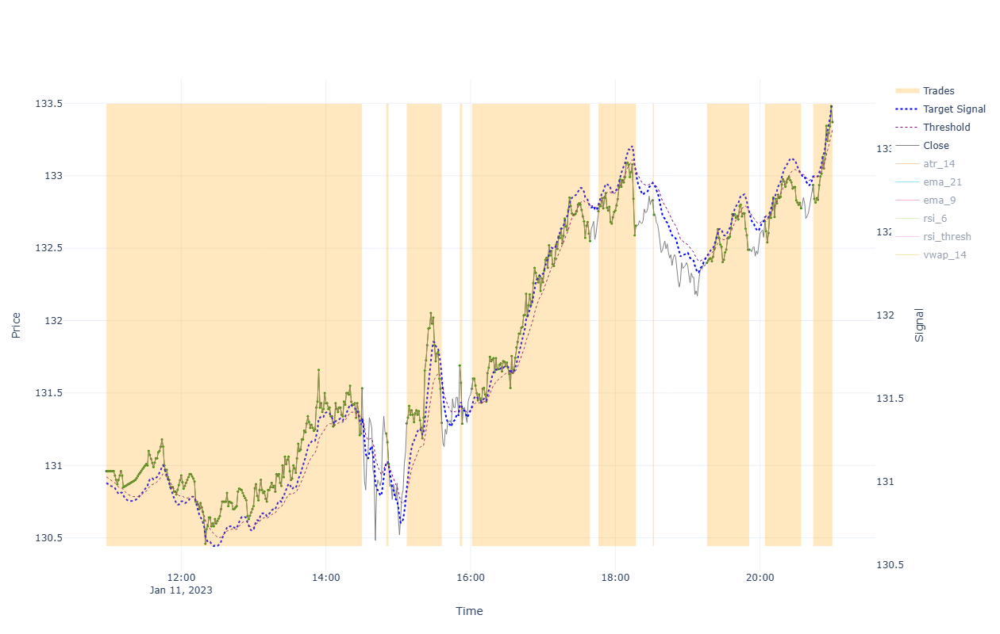


=== Performance for 2023-01-11 00:00:00 ===

BUY&HOLD:
  Bid(0) 133.343 - Ask(0) 131.559 - Fee(0) [0.004+0.023] = 1.758
TRADES:
  Bid(1) 131.506 - Ask(1) 130.724 - Fee(1) [0.0+0.022] = 0.76
  Bid(2) 130.984 - Ask(2) 131.246 - Fee(2) [0.004+0.022] = -0.289
  Bid(3) 131.269 - Ask(3) 131.316 - Fee(3) [0.004+0.022] = -0.074
  Bid(4) 131.263 - Ask(4) 131.716 - Fee(4) [0.004+0.022] = -0.48
  Bid(5) 132.523 - Ask(5) 131.556 - Fee(5) [0.004+0.022] = 0.941
  Bid(6) 132.628 - Ask(6) 132.782 - Fee(6) [0.004+0.022] = -0.18
  Bid(7) 132.703 - Ask(7) 132.857 - Fee(7) [0.004+0.023] = -0.18
  Bid(8) 132.464 - Ask(8) 132.426 - Fee(8) [0.004+0.022] = 0.011
  Bid(9) 132.748 - Ask(9) 132.712 - Fee(9) [0.004+0.023] = 0.01
  Bid(10) 133.343 - Ask(10) 132.962 - Fee(10) [0.004+0.0] = 0.378
STRATEGY:
  Trade(1) 0.76 + Trade(2) -0.289 + Trade(3) -0.074 + Trade(4) -0.48 + Trade(5) 0.941 + Trade(6) -0.18 + Trade(7) -0.18 + Trade(8) 0.011 + Trade(9) 0.01 + Trade(10) 0.378 = 0.897

--------------------------------

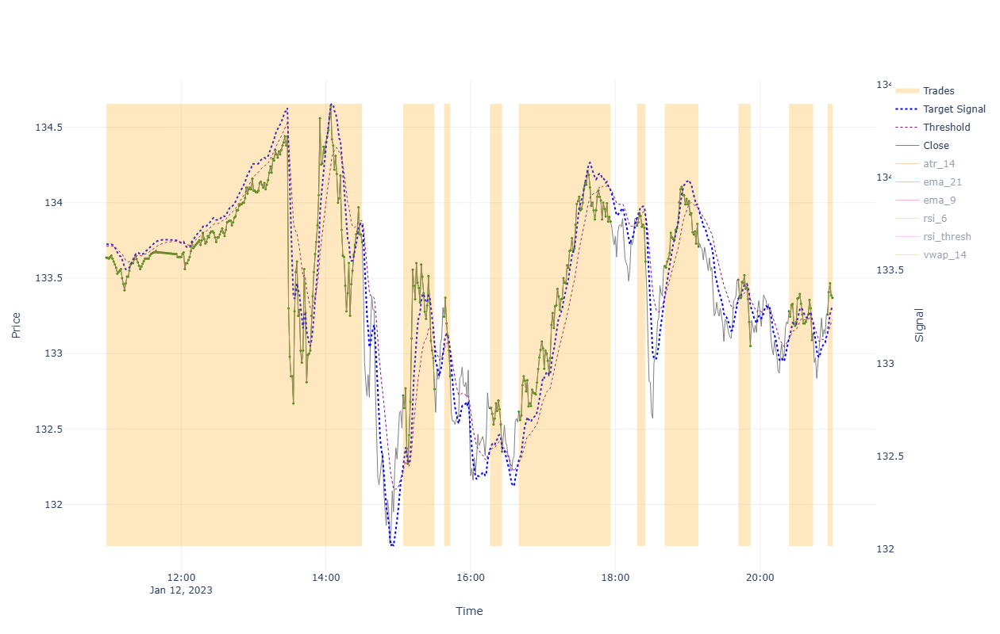


=== Performance for 2023-01-12 00:00:00 ===

BUY&HOLD:
  Bid(0) 133.343 - Ask(0) 133.766 - Fee(0) [0.004+0.023] = -0.449
TRADES:
  Bid(1) 133.712 - Ask(1) 133.343 - Fee(1) [0.0+0.023] = 0.346
  Bid(2) 132.738 - Ask(2) 132.748 - Fee(2) [0.004+0.023] = -0.036
  Bid(3) 132.824 - Ask(3) 133.272 - Fee(3) [0.004+0.023] = -0.475
  Bid(4) 132.324 - Ask(4) 132.667 - Fee(4) [0.004+0.022] = -0.369
  Bid(5) 133.848 - Ask(5) 132.642 - Fee(5) [0.004+0.023] = 1.18
  Bid(6) 133.583 - Ask(6) 133.876 - Fee(6) [0.004+0.023] = -0.319
  Bid(7) 133.683 - Ask(7) 133.607 - Fee(7) [0.004+0.023] = 0.05
  Bid(8) 133.023 - Ask(8) 133.517 - Fee(8) [0.004+0.023] = -0.52
  Bid(9) 133.103 - Ask(9) 133.307 - Fee(9) [0.004+0.023] = -0.23
  Bid(10) 133.343 - Ask(10) 133.287 - Fee(10) [0.004+0.0] = 0.053
STRATEGY:
  Trade(1) 0.346 + Trade(2) -0.036 + Trade(3) -0.475 + Trade(4) -0.369 + Trade(5) 1.18 + Trade(6) -0.319 + Trade(7) 0.05 + Trade(8) -0.52 + Trade(9) -0.23 + Trade(10) 0.053 = -0.32

---------------------------

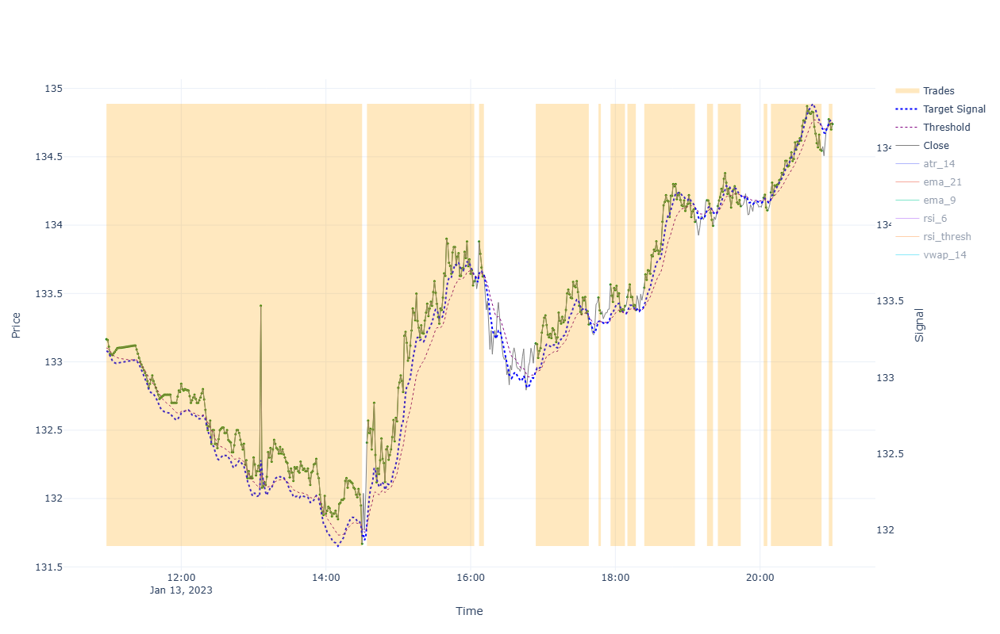


=== Performance for 2023-01-13 00:00:00 ===

BUY&HOLD:
  Bid(0) 134.713 - Ask(0) 131.696 - Fee(0) [0.004+0.023] = 2.99
TRADES:
  Bid(1) 131.644 - Ask(1) 133.343 - Fee(1) [0.0+0.022] = -1.722
  Bid(2) 133.563 - Ask(2) 132.436 - Fee(2) [0.004+0.023] = 1.1
  Bid(3) 133.603 - Ask(3) 133.907 - Fee(3) [0.004+0.023] = -0.33
  Bid(4) 133.248 - Ask(4) 133.162 - Fee(4) [0.004+0.023] = 0.06
  Bid(5) 133.328 - Ask(5) 133.497 - Fee(5) [0.004+0.023] = -0.195
  Bid(6) 133.383 - Ask(6) 133.592 - Fee(6) [0.004+0.023] = -0.235
  Bid(7) 133.353 - Ask(7) 133.502 - Fee(7) [0.004+0.023] = -0.175
  Bid(8) 133.999 - Ask(8) 133.569 - Fee(8) [0.004+0.023] = 0.403
  Bid(9) 133.969 - Ask(9) 134.208 - Fee(9) [0.004+0.023] = -0.266
  Bid(10) 134.113 - Ask(10) 134.167 - Fee(10) [0.004+0.023] = -0.08
  Bid(11) 134.082 - Ask(11) 134.227 - Fee(11) [0.004+0.023] = -0.172
  Bid(12) 134.518 - Ask(12) 134.267 - Fee(12) [0.004+0.023] = 0.225
  Bid(13) 134.713 - Ask(13) 134.802 - Fee(13) [0.004+0.0] = -0.093
STRATEGY:
  Tra

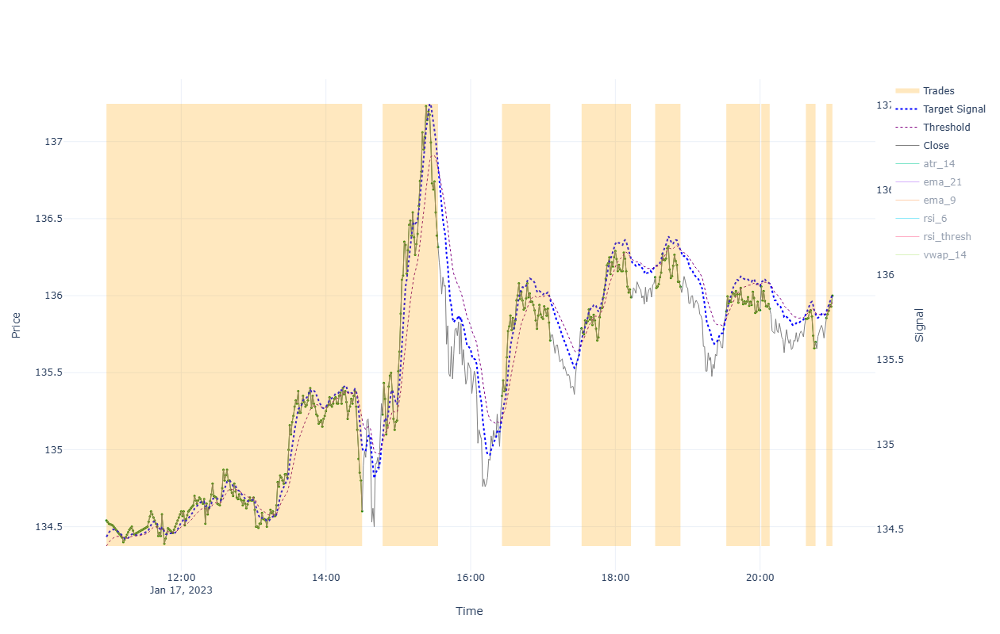


=== Performance for 2023-01-17 00:00:00 ===

BUY&HOLD:
  Bid(0) 135.973 - Ask(0) 134.628 - Fee(0) [0.004+0.023] = 1.317
TRADES:
  Bid(1) 134.575 - Ask(1) 134.713 - Fee(1) [0.0+0.023] = -0.161
  Bid(2) 136.288 - Ask(2) 135.255 - Fee(2) [0.004+0.023] = 1.006
  Bid(3) 135.683 - Ask(3) 135.377 - Fee(3) [0.004+0.023] = 0.279
  Bid(4) 135.963 - Ask(4) 135.815 - Fee(4) [0.004+0.023] = 0.121
  Bid(5) 136.031 - Ask(5) 136.147 - Fee(5) [0.004+0.023] = -0.143
  Bid(6) 135.88 - Ask(6) 135.924 - Fee(6) [0.004+0.023] = -0.071
  Bid(7) 135.888 - Ask(7) 136.087 - Fee(7) [0.004+0.023] = -0.226
  Bid(8) 135.673 - Ask(8) 135.877 - Fee(8) [0.004+0.023] = -0.231
  Bid(9) 135.973 - Ask(9) 135.882 - Fee(9) [0.004+0.0] = 0.087
STRATEGY:
  Trade(1) -0.161 + Trade(2) 1.006 + Trade(3) 0.279 + Trade(4) 0.121 + Trade(5) -0.143 + Trade(6) -0.071 + Trade(7) -0.226 + Trade(8) -0.231 + Trade(9) 0.087 = 0.661

-------------------------------------------------------------------------------------------------------------

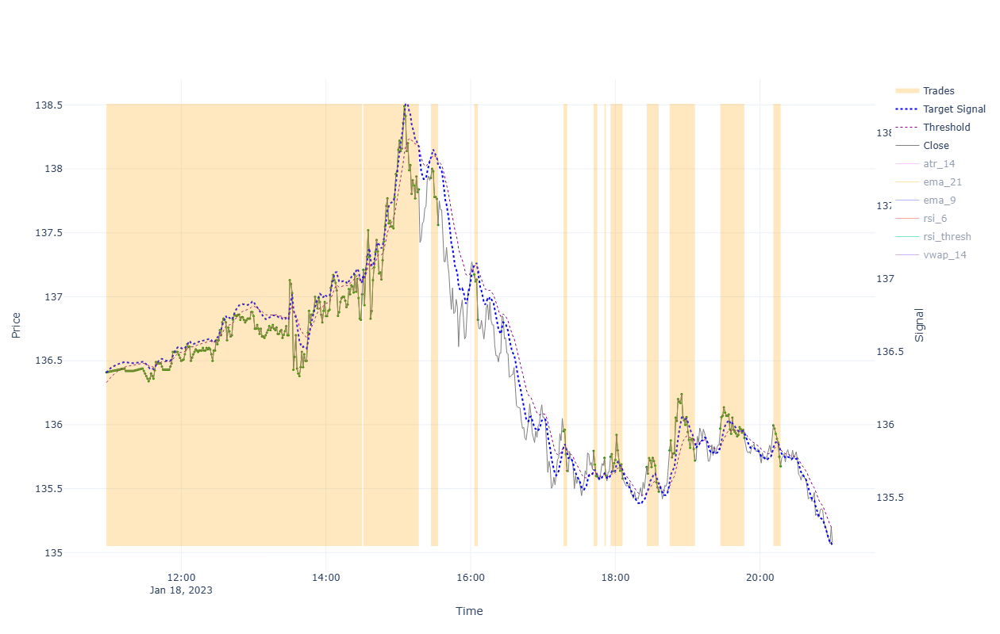


=== Performance for 2023-01-18 00:00:00 ===

BUY&HOLD:
  Bid(0) 135.053 - Ask(0) 137.047 - Fee(0) [0.004+0.023] = -2.021
TRADES:
  Bid(1) 136.993 - Ask(1) 135.973 - Fee(1) [0.0+0.023] = 0.997
  Bid(2) 137.812 - Ask(2) 137.238 - Fee(2) [0.004+0.023] = 0.548
  Bid(3) 137.534 - Ask(3) 137.958 - Fee(3) [0.004+0.023] = -0.45
  Bid(4) 136.793 - Ask(4) 137.202 - Fee(4) [0.004+0.023] = -0.437
  Bid(5) 135.613 - Ask(5) 135.977 - Fee(5) [0.004+0.023] = -0.391
  Bid(6) 135.568 - Ask(6) 135.822 - Fee(6) [0.004+0.023] = -0.281
  Bid(7) 135.578 - Ask(7) 135.767 - Fee(7) [0.004+0.023] = -0.216
  Bid(8) 135.553 - Ask(8) 135.777 - Fee(8) [0.004+0.023] = -0.251
  Bid(9) 135.451 - Ask(9) 135.697 - Fee(9) [0.004+0.023] = -0.273
  Bid(10) 135.693 - Ask(10) 135.827 - Fee(10) [0.004+0.023] = -0.161
  Bid(11) 135.87 - Ask(11) 135.997 - Fee(11) [0.004+0.023] = -0.154
  Bid(12) 135.648 - Ask(12) 136.022 - Fee(12) [0.004+0.023] = -0.401
STRATEGY:
  Trade(1) 0.997 + Trade(2) 0.548 + Trade(3) -0.45 + Trade(4) -0.

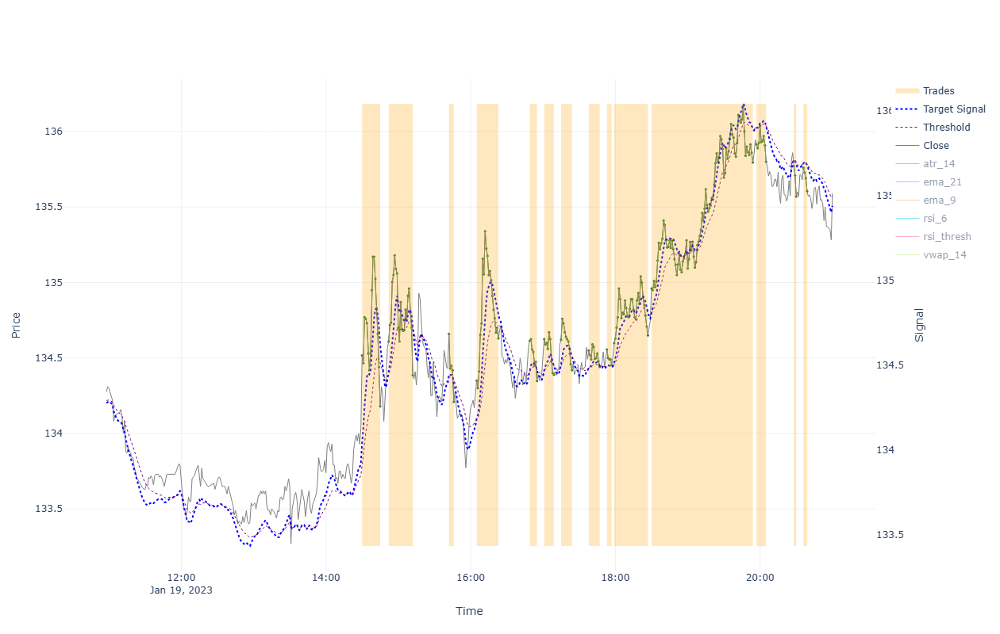


=== Performance for 2023-01-19 00:00:00 ===

BUY&HOLD:
  Bid(0) 135.563 - Ask(0) 134.544 - Fee(0) [0.004+0.023] = 0.992
TRADES:
  Bid(1) 134.153 - Ask(1) 134.544 - Fee(1) [0.004+0.023] = -0.417
  Bid(2) 134.358 - Ask(2) 134.635 - Fee(2) [0.004+0.023] = -0.304
  Bid(3) 134.183 - Ask(3) 134.687 - Fee(3) [0.004+0.023] = -0.53
  Bid(4) 134.603 - Ask(4) 134.377 - Fee(4) [0.004+0.023] = 0.2
  Bid(5) 134.32 - Ask(5) 134.641 - Fee(5) [0.004+0.023] = -0.348
  Bid(6) 134.363 - Ask(6) 134.652 - Fee(6) [0.004+0.023] = -0.316
  Bid(7) 134.393 - Ask(7) 134.648 - Fee(7) [0.004+0.023] = -0.282
  Bid(8) 134.413 - Ask(8) 134.577 - Fee(8) [0.004+0.023] = -0.191
  Bid(9) 134.426 - Ask(9) 134.583 - Fee(9) [0.004+0.023] = -0.183
  Bid(10) 134.623 - Ask(10) 134.625 - Fee(10) [0.004+0.023] = -0.029
  Bid(11) 135.768 - Ask(11) 134.987 - Fee(11) [0.004+0.023] = 0.754
  Bid(12) 135.773 - Ask(12) 135.942 - Fee(12) [0.004+0.023] = -0.196
  Bid(13) 135.543 - Ask(13) 135.797 - Fee(13) [0.004+0.023] = -0.281
  Bid(1

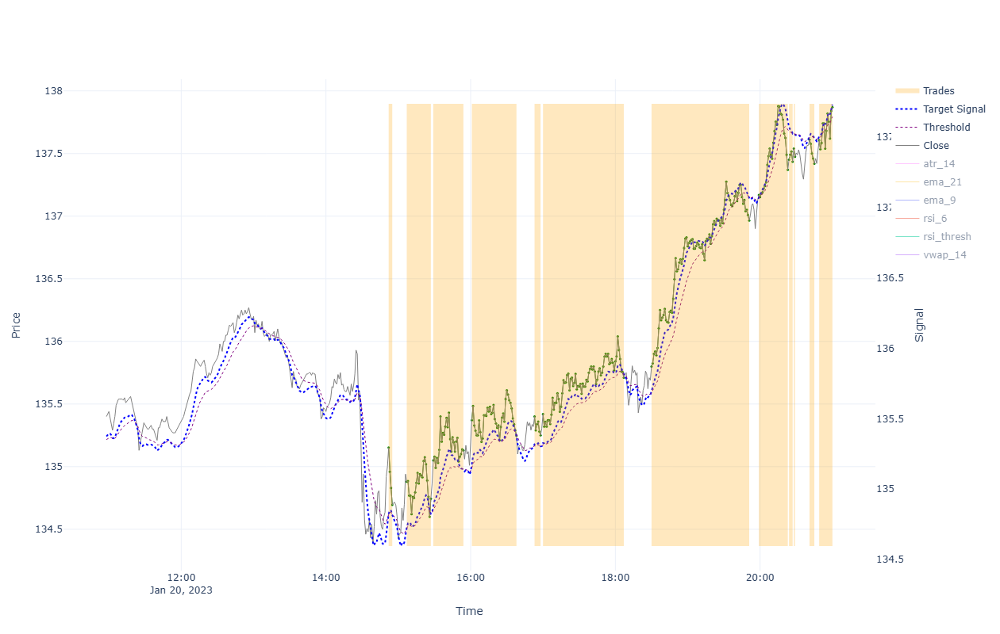


=== Performance for 2023-01-20 00:00:00 ===

BUY&HOLD:
  Bid(0) 137.842 - Ask(0) 134.742 - Fee(0) [0.004+0.023] = 3.073
TRADES:
  Bid(1) 134.668 - Ask(1) 135.179 - Fee(1) [0.004+0.023] = -0.538
  Bid(2) 134.717 - Ask(2) 134.907 - Fee(2) [0.004+0.023] = -0.217
  Bid(3) 135.103 - Ask(3) 135.077 - Fee(3) [0.004+0.023] = -0.001
  Bid(4) 135.22 - Ask(4) 135.397 - Fee(4) [0.004+0.023] = -0.204
  Bid(5) 135.223 - Ask(5) 135.427 - Fee(5) [0.004+0.023] = -0.231
  Bid(6) 135.683 - Ask(6) 135.447 - Fee(6) [0.004+0.023] = 0.209
  Bid(7) 136.938 - Ask(7) 135.827 - Fee(7) [0.004+0.023] = 1.083
  Bid(8) 137.343 - Ask(8) 137.197 - Fee(8) [0.004+0.023] = 0.118
  Bid(9) 137.408 - Ask(9) 137.478 - Fee(9) [0.004+0.023] = -0.097
  Bid(10) 137.448 - Ask(10) 137.567 - Fee(10) [0.004+0.023] = -0.147
  Bid(11) 137.393 - Ask(11) 137.637 - Fee(11) [0.004+0.023] = -0.272
  Bid(12) 137.842 - Ask(12) 137.634 - Fee(12) [0.004+0.0] = 0.205
STRATEGY:
  Trade(1) -0.538 + Trade(2) -0.217 + Trade(3) -0.001 + Trade(4) -0

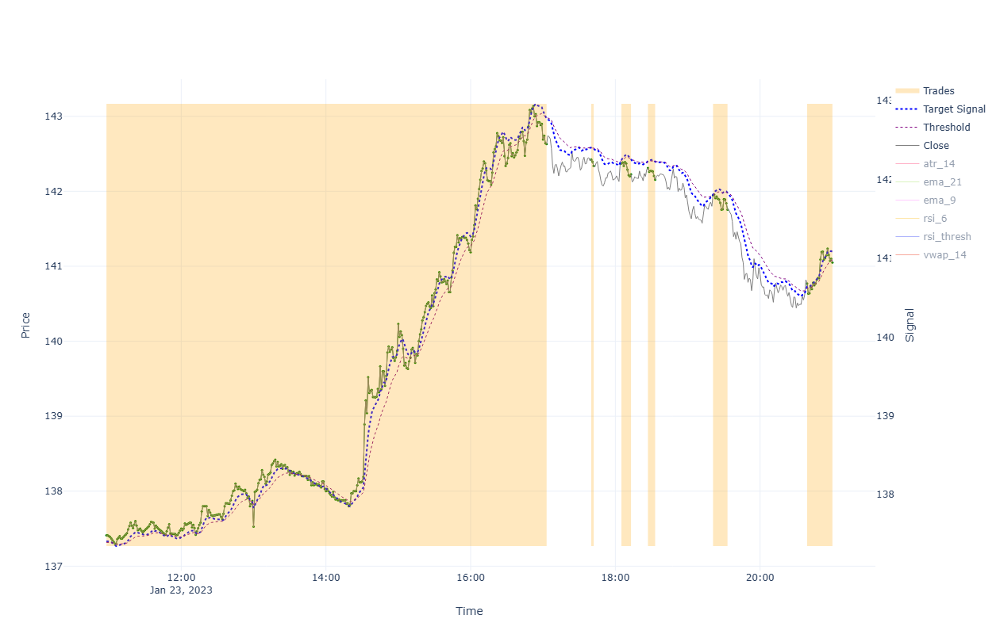


=== Performance for 2023-01-23 00:00:00 ===

BUY&HOLD:
  Bid(0) 141.022 - Ask(0) 138.158 - Fee(0) [0.004+0.024] = 2.837
TRADES:
  Bid(1) 142.601 - Ask(1) 137.842 - Fee(1) [0.0+0.024] = 4.735
  Bid(2) 142.312 - Ask(2) 142.453 - Fee(2) [0.004+0.024] = -0.17
  Bid(3) 142.197 - Ask(3) 142.398 - Fee(3) [0.004+0.024] = -0.23
  Bid(4) 142.127 - Ask(4) 142.338 - Fee(4) [0.004+0.024] = -0.24
  Bid(5) 141.727 - Ask(5) 141.973 - Fee(5) [0.004+0.024] = -0.274
  Bid(6) 141.022 - Ask(6) 140.798 - Fee(6) [0.004+0.0] = 0.22
STRATEGY:
  Trade(1) 4.735 + Trade(2) -0.17 + Trade(3) -0.23 + Trade(4) -0.24 + Trade(5) -0.274 + Trade(6) 0.22 = 4.041

------------------------------------------------------------------------------------------------------------------------



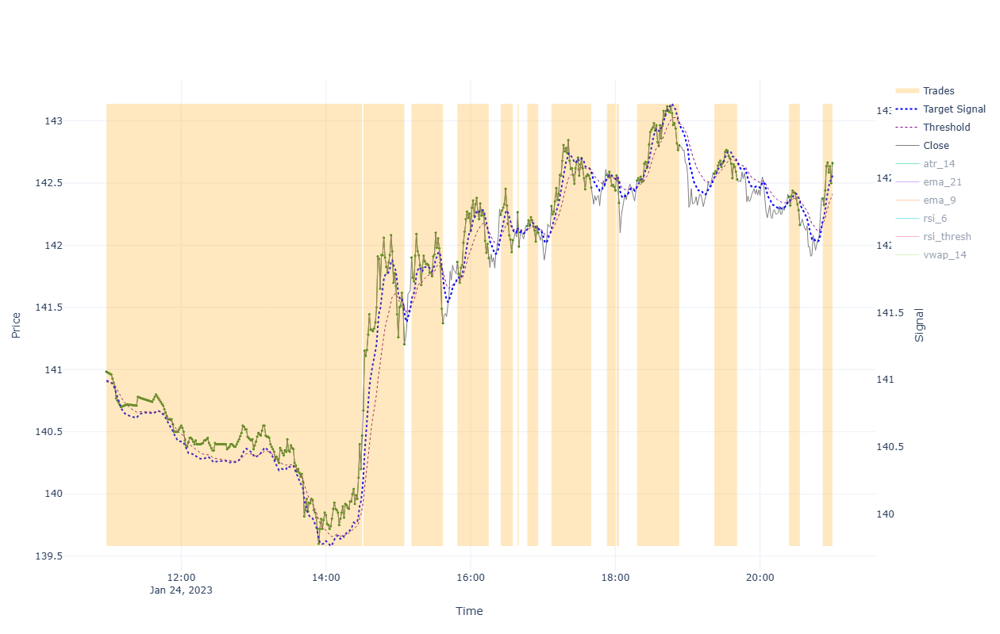


=== Performance for 2023-01-24 00:00:00 ===

BUY&HOLD:
  Bid(0) 142.631 - Ask(0) 140.498 - Fee(0) [0.004+0.024] = 2.105
TRADES:
  Bid(1) 140.442 - Ask(1) 141.022 - Fee(1) [0.0+0.024] = -0.603
  Bid(2) 141.177 - Ask(2) 140.698 - Fee(2) [0.004+0.024] = 0.451
  Bid(3) 141.344 - Ask(3) 141.928 - Fee(3) [0.004+0.024] = -0.612
  Bid(4) 141.867 - Ask(4) 141.893 - Fee(4) [0.004+0.024] = -0.055
  Bid(5) 142.012 - Ask(5) 142.273 - Fee(5) [0.004+0.024] = -0.29
  Bid(6) 141.962 - Ask(6) 142.293 - Fee(6) [0.004+0.024] = -0.36
  Bid(7) 142.072 - Ask(7) 142.183 - Fee(7) [0.004+0.024] = -0.14
  Bid(8) 142.435 - Ask(8) 142.343 - Fee(8) [0.004+0.024] = 0.063
  Bid(9) 142.412 - Ask(9) 142.594 - Fee(9) [0.004+0.024] = -0.21
  Bid(10) 142.312 - Ask(10) 142.589 - Fee(10) [0.004+0.024] = -0.305
  Bid(11) 142.774 - Ask(11) 142.549 - Fee(11) [0.004+0.024] = 0.197
  Bid(12) 142.501 - Ask(12) 142.604 - Fee(12) [0.004+0.024] = -0.13
  Bid(13) 142.135 - Ask(13) 142.418 - Fee(13) [0.004+0.024] = -0.311
  Bid(14) 1

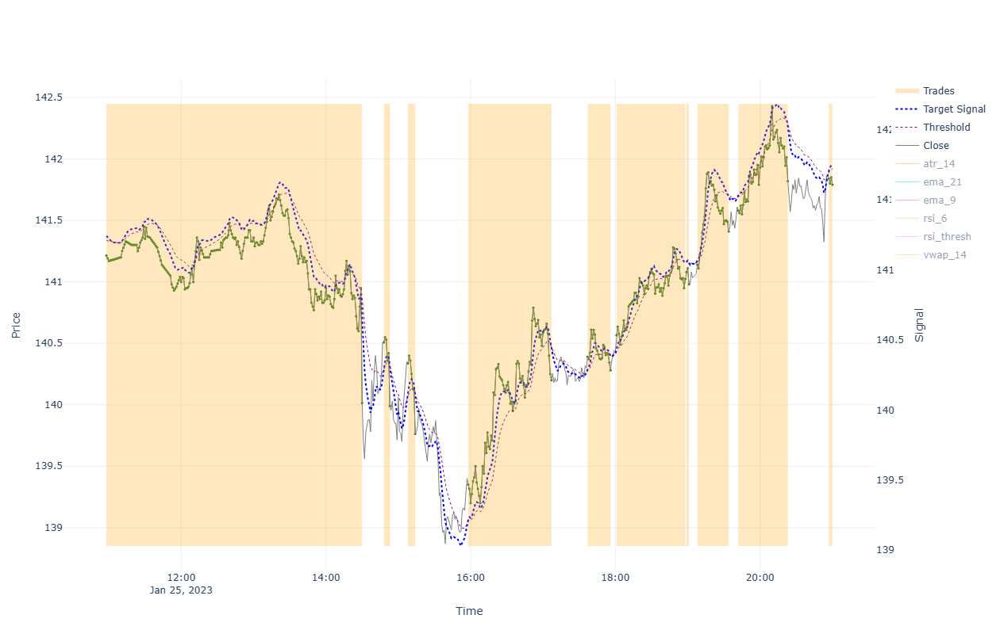


=== Performance for 2023-01-25 00:00:00 ===

BUY&HOLD:
  Bid(0) 141.762 - Ask(0) 140.043 - Fee(0) [0.004+0.024] = 1.691
TRADES:
  Bid(1) 139.987 - Ask(1) 142.631 - Fee(1) [0.0+0.024] = -2.668
  Bid(2) 139.962 - Ask(2) 140.535 - Fee(2) [0.004+0.024] = -0.601
  Bid(3) 139.735 - Ask(3) 140.365 - Fee(3) [0.004+0.023] = -0.658
  Bid(4) 140.172 - Ask(4) 139.378 - Fee(4) [0.004+0.024] = 0.767
  Bid(5) 140.252 - Ask(5) 140.418 - Fee(5) [0.004+0.024] = -0.194
  Bid(6) 140.996 - Ask(6) 140.593 - Fee(6) [0.004+0.024] = 0.375
  Bid(7) 140.952 - Ask(7) 141.108 - Fee(7) [0.004+0.024] = -0.184
  Bid(8) 141.382 - Ask(8) 141.168 - Fee(8) [0.004+0.024] = 0.186
  Bid(9) 141.792 - Ask(9) 141.608 - Fee(9) [0.004+0.024] = 0.155
  Bid(10) 141.762 - Ask(10) 141.868 - Fee(10) [0.004+0.0] = -0.111
STRATEGY:
  Trade(1) -2.668 + Trade(2) -0.601 + Trade(3) -0.658 + Trade(4) 0.767 + Trade(5) -0.194 + Trade(6) 0.375 + Trade(7) -0.184 + Trade(8) 0.186 + Trade(9) 0.155 + Trade(10) -0.111 = -2.933

-------------------

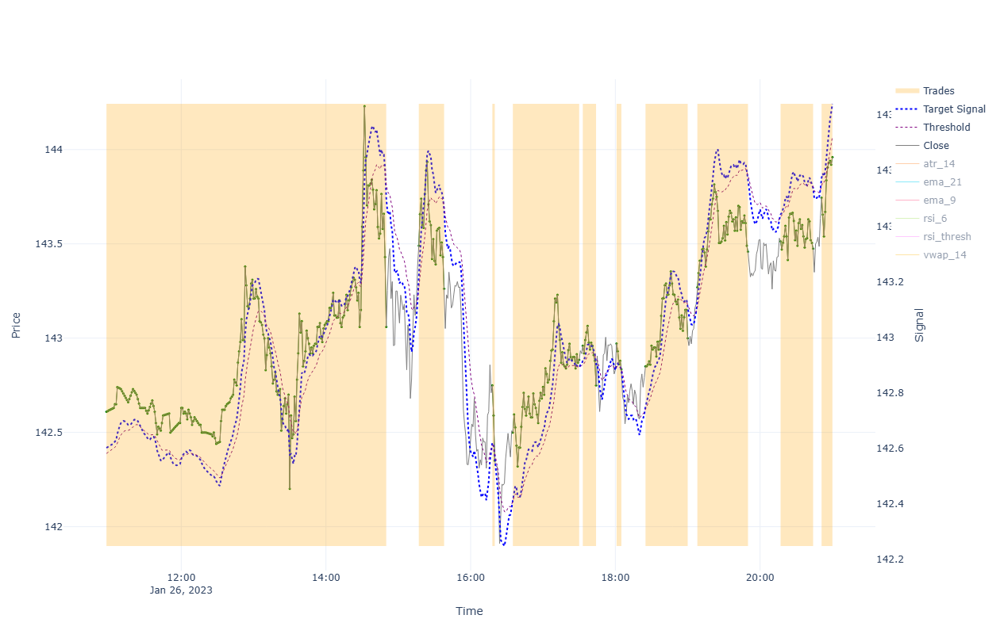


=== Performance for 2023-01-26 00:00:00 ===

BUY&HOLD:
  Bid(0) 143.931 - Ask(0) 143.62 - Fee(0) [0.004+0.024] = 0.283
TRADES:
  Bid(1) 143.031 - Ask(1) 141.762 - Fee(1) [0.0+0.024] = 1.246
  Bid(2) 143.233 - Ask(2) 143.519 - Fee(2) [0.004+0.024] = -0.313
  Bid(3) 142.322 - Ask(3) 142.779 - Fee(3) [0.004+0.024] = -0.485
  Bid(4) 142.856 - Ask(4) 142.529 - Fee(4) [0.004+0.024] = 0.3
  Bid(5) 142.721 - Ask(5) 142.989 - Fee(5) [0.004+0.024] = -0.295
  Bid(6) 142.806 - Ask(6) 143.0 - Fee(6) [0.004+0.024] = -0.222
  Bid(7) 142.971 - Ask(7) 142.879 - Fee(7) [0.004+0.024] = 0.065
  Bid(8) 143.43 - Ask(8) 143.299 - Fee(8) [0.004+0.024] = 0.103
  Bid(9) 143.446 - Ask(9) 143.543 - Fee(9) [0.004+0.024] = -0.125
  Bid(10) 143.931 - Ask(10) 143.774 - Fee(10) [0.004+0.0] = 0.153
STRATEGY:
  Trade(1) 1.246 + Trade(2) -0.313 + Trade(3) -0.485 + Trade(4) 0.3 + Trade(5) -0.295 + Trade(6) -0.222 + Trade(7) 0.065 + Trade(8) 0.103 + Trade(9) -0.125 + Trade(10) 0.153 = 0.427

------------------------------

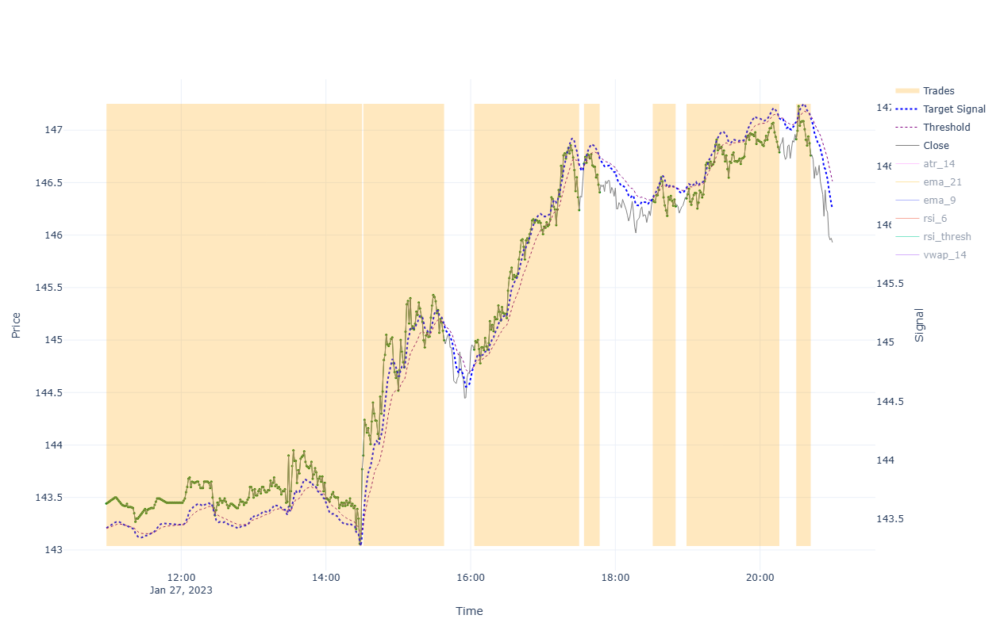


=== Performance for 2023-01-27 00:00:00 ===

BUY&HOLD:
  Bid(0) 145.901 - Ask(0) 143.799 - Fee(0) [0.004+0.024] = 2.074
TRADES:
  Bid(1) 143.741 - Ask(1) 143.931 - Fee(1) [0.0+0.024] = -0.214
  Bid(2) 144.969 - Ask(2) 143.929 - Fee(2) [0.004+0.024] = 1.012
  Bid(3) 146.211 - Ask(3) 144.939 - Fee(3) [0.004+0.024] = 1.243
  Bid(4) 146.381 - Ask(4) 146.709 - Fee(4) [0.004+0.024] = -0.357
  Bid(5) 146.247 - Ask(5) 146.366 - Fee(5) [0.004+0.024] = -0.148
  Bid(6) 146.761 - Ask(6) 146.379 - Fee(6) [0.004+0.024] = 0.353
  Bid(7) 146.731 - Ask(7) 146.944 - Fee(7) [0.004+0.024] = -0.242
STRATEGY:
  Trade(1) -0.214 + Trade(2) 1.012 + Trade(3) 1.243 + Trade(4) -0.357 + Trade(5) -0.148 + Trade(6) 0.353 + Trade(7) -0.242 = 1.647

------------------------------------------------------------------------------------------------------------------------



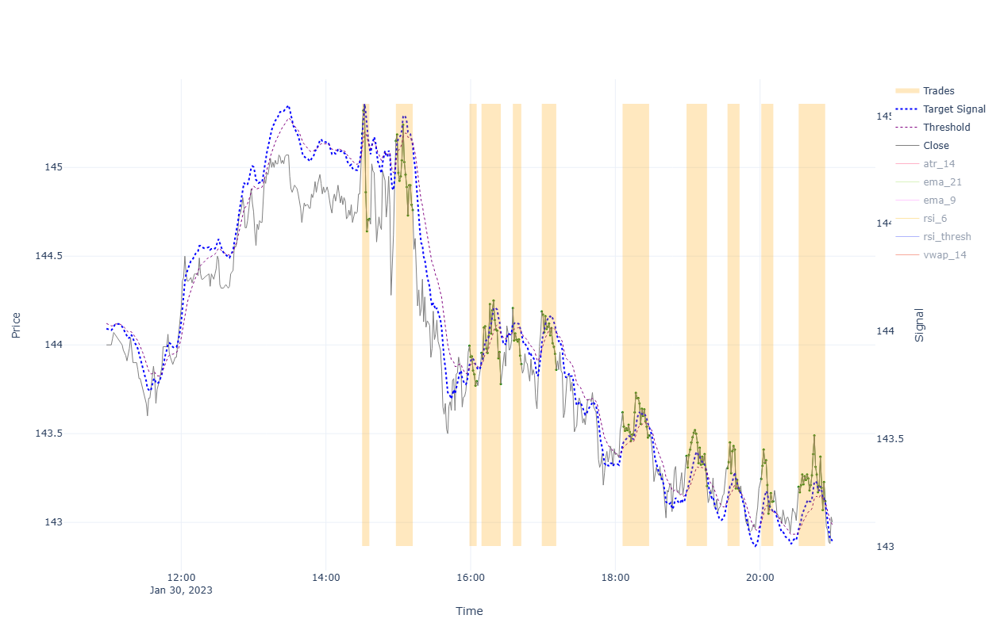


=== Performance for 2023-01-30 00:00:00 ===

BUY&HOLD:
  Bid(0) 142.971 - Ask(0) 145.219 - Fee(0) [0.004+0.024] = -2.276
TRADES:
  Bid(1) 144.681 - Ask(1) 145.219 - Fee(1) [0.004+0.024] = -0.566
  Bid(2) 144.731 - Ask(2) 145.179 - Fee(2) [0.004+0.024] = -0.476
  Bid(3) 143.766 - Ask(3) 144.024 - Fee(3) [0.004+0.024] = -0.286
  Bid(4) 143.751 - Ask(4) 143.984 - Fee(4) [0.004+0.024] = -0.26
  Bid(5) 143.863 - Ask(5) 144.236 - Fee(5) [0.004+0.024] = -0.401
  Bid(6) 143.831 - Ask(6) 144.217 - Fee(6) [0.004+0.024] = -0.414
  Bid(7) 143.461 - Ask(7) 143.649 - Fee(7) [0.004+0.024] = -0.215
  Bid(8) 143.176 - Ask(8) 143.404 - Fee(8) [0.004+0.024] = -0.255
  Bid(9) 143.149 - Ask(9) 143.334 - Fee(9) [0.004+0.024] = -0.213
  Bid(10) 143.09 - Ask(10) 143.274 - Fee(10) [0.004+0.024] = -0.212
  Bid(11) 143.091 - Ask(11) 143.229 - Fee(11) [0.004+0.024] = -0.165
STRATEGY:
  Trade(1) -0.566 + Trade(2) -0.476 + Trade(3) -0.286 + Trade(4) -0.26 + Trade(5) -0.401 + Trade(6) -0.414 + Trade(7) -0.215 + Tra

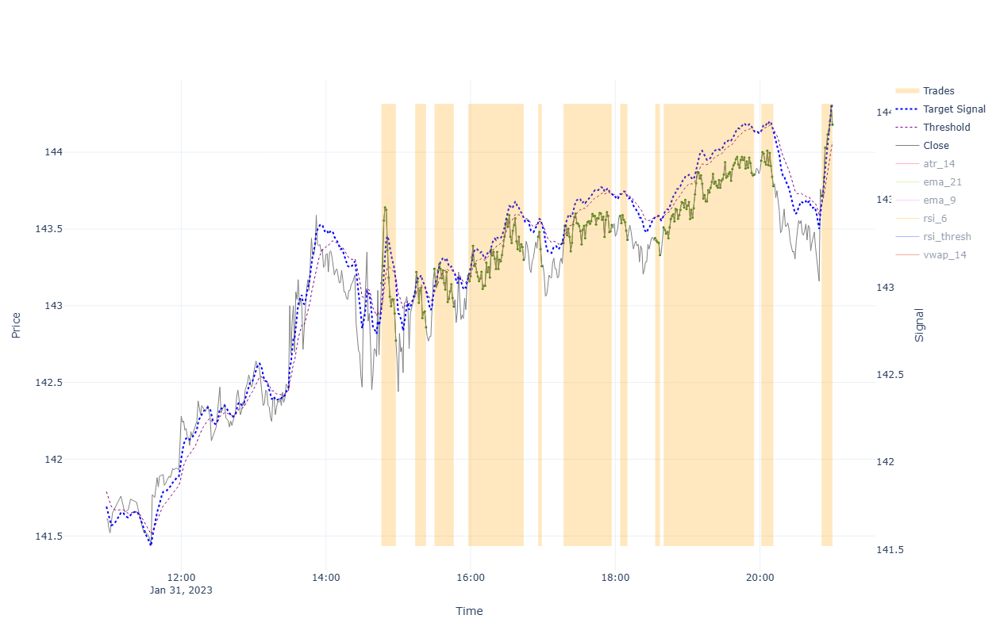


=== Performance for 2023-01-31 00:00:00 ===

BUY&HOLD:
  Bid(0) 144.151 - Ask(0) 142.498 - Fee(0) [0.004+0.024] = 1.625
TRADES:
  Bid(1) 142.744 - Ask(1) 143.177 - Fee(1) [0.004+0.024] = -0.461
  Bid(2) 142.831 - Ask(2) 143.109 - Fee(2) [0.004+0.024] = -0.305
  Bid(3) 142.966 - Ask(3) 143.268 - Fee(3) [0.004+0.024] = -0.33
  Bid(4) 143.271 - Ask(4) 143.224 - Fee(4) [0.004+0.024] = 0.02
  Bid(5) 143.23 - Ask(5) 143.479 - Fee(5) [0.004+0.024] = -0.277
  Bid(6) 143.496 - Ask(6) 143.439 - Fee(6) [0.004+0.024] = 0.03
  Bid(7) 143.401 - Ask(7) 143.614 - Fee(7) [0.004+0.024] = -0.24
  Bid(8) 143.301 - Ask(8) 143.469 - Fee(8) [0.004+0.024] = -0.195
  Bid(9) 143.826 - Ask(9) 143.539 - Fee(9) [0.004+0.024] = 0.259
  Bid(10) 143.751 - Ask(10) 143.974 - Fee(10) [0.004+0.024] = -0.251
  Bid(11) 144.151 - Ask(11) 143.744 - Fee(11) [0.004+0.0] = 0.403
STRATEGY:
  Trade(1) -0.461 + Trade(2) -0.305 + Trade(3) -0.33 + Trade(4) 0.02 + Trade(5) -0.277 + Trade(6) 0.03 + Trade(7) -0.24 + Trade(8) -0.195 + 

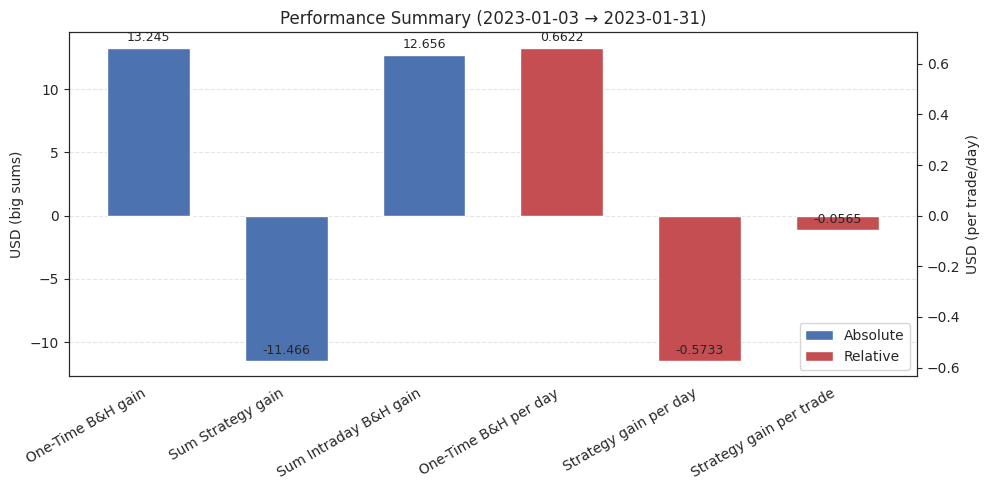


Overall Summary (2023-01-03 = 130.906 → 2023-01-31 = 144.151)
Num. trading days: 20
Trades Count: 203

One-Time B&H gain: 13.245
Sum Strategy gain: -11.466
Sum Intraday B&H gain: 12.656

One-Time B&H gain per day: 0.6622
Strategy gain per day: -0.5733
Strategy gain per trade: -0.0565


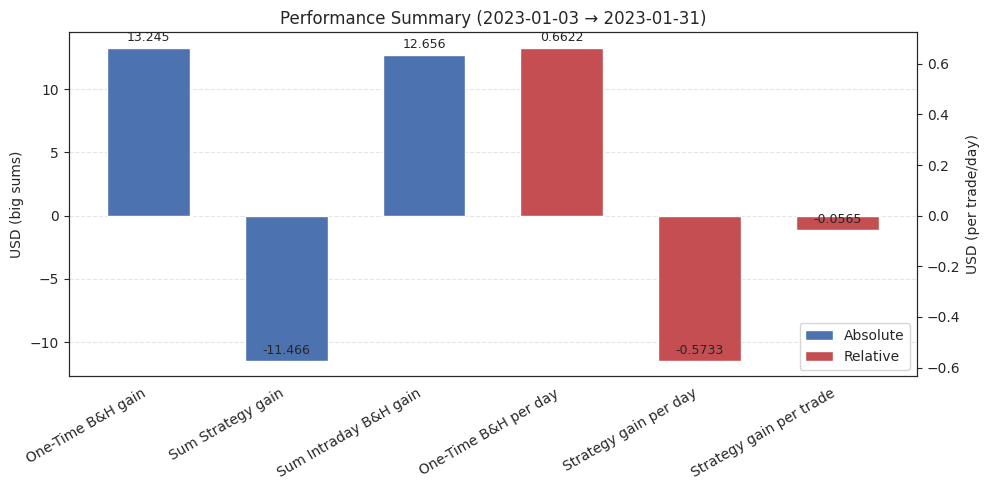

In [251]:
importlib.reload(params) ######
importlib.reload(plots) ######

df_month = df_inds_test[df_inds_test.index.to_period("M") == params.month_to_check]
year, month = map(int, params.month_to_check.split("-"))
days_in_month = [d for d in sim_results if d.year == year and d.month == month]

if not days_in_month:
    print(f"No simulation data for {params.month_to_check}")
else:
    for day in sorted(days_in_month):
        df_day, trades_day, stats_day = sim_results[day]
        plots.plot_trades(
            df                 = df_day,
            col_signal1        = "ema_9",
            sign_thresh        = "ema_21", 
            trades             = trades_day,
            performance_stats  = stats_day,
            features           = ['ema_9','ema_21','rsi_6', 'atr_14', 'vwap_14', 'rsi_thresh'],
            extra_hover_fields = ['vwap_14', 'rsi_6', 'atr_14'], 
            autoscale          = False
        )
        
        print(f"\n=== Performance for {day} ===\n")
        for k, v in stats_day.items():
            lines = v if isinstance(v, list) else str(v).splitlines()
            print(f"{k}:")
            for L in lines:
                print("  " + L)
        print("\n" + "-" * 120 + "\n")

# monthly / overall aggregates
plots.aggregate_performance([sim_results[d][2] for d in sorted(days_in_month)], df_month)
plots.aggregate_performance([sim_results[d][2] for d in sorted(sim_results)], df_inds_test)


In [186]:
import pandas as pd

day = pd.Timestamp("2023-01-05")
rng = slice(day + pd.Timedelta(hours=14, minutes=25), day + pd.Timedelta(hours=14, minutes=35))

# 1) df_sim for the day (if present)
print("=== df_sim rows 14:25-14:35 ===")
if day in sim_results:
    df_sim_day = sim_results[day][0]
    if not df_sim_day.loc[rng].empty:
        print(df_sim_day.loc[rng, ["Position","Action","TradedAmount"]].to_string())
    else:
        print(" no rows in df_sim for that window")
else:
    print(" no sim_results entry for", day)

# 2) df_actions generator output for the same window
print("\n=== df_actions rows 14:25-14:35 ===")
if "df_actions" in globals():
    sub = df_actions.loc[rng, ["bid","ask","action"]]
    if not sub.empty:
        print(sub.to_string())
    else:
        print(" no rows in df_actions for that window")
else:
    print(" df_actions not found in globals()")

# 3) simulator start position and all trades for the day
print("\n=== simulator start row, start Position, and trades ===")
if day in sim_results:
    df_sim_day, trades_day, perf_day = sim_results[day]
    print("sim start index:", df_sim_day.index[0])
    print("sim start Position:", df_sim_day.iloc[0]["Position"])
    print("\nTrades (entry_ts -> exit_ts | entry_price -> exit_price):")
    if trades_day:
        for i, tr in enumerate(trades_day, 1):
            (entry_ts, exit_ts), (entry_p, exit_p), pct, buy_fee, sell_fee = tr
            print(i, entry_ts, "->", exit_ts, "|", _r3(entry_p) if ' _r3' in globals() else entry_p, "->", _r3(exit_p) if ' _r3' in globals() else exit_p, "| pct:", pct)
    else:
        print(" no trades recorded for this day")
else:
    print(" no sim_results entry for", day)


=== df_sim rows 14:25-14:35 ===
                     Position Action  TradedAmount
2023-01-05 14:25:00       1.0   Hold             0
2023-01-05 14:26:00       1.0   Hold             0
2023-01-05 14:27:00       1.0   Hold             0
2023-01-05 14:28:00       1.0   Hold             0
2023-01-05 14:29:00       1.0   Hold             0
2023-01-05 14:30:00       0.0   Sell            -1
2023-01-05 14:31:00       1.0    Buy             1
2023-01-05 14:32:00       0.0   Sell            -1
2023-01-05 14:33:00       0.0   Hold             0
2023-01-05 14:34:00       0.0   Hold             0
2023-01-05 14:35:00       0.0   Hold             0

=== df_actions rows 14:25-14:35 ===
 no rows in df_actions for that window

=== simulator start row, start Position, and trades ===
sim start index: 2023-01-05 10:58:00
sim start Position: 1.0

Trades (entry_ts -> exit_ts | entry_price -> exit_price):
1 2023-01-05 10:58:00 -> 2023-01-05 14:32:00 | 126.334728 -> 126.479699 | pct: 0.115
2 2023-01-05 14:52